In [2]:
# ! pip install geopandas
# ! pip install earthpy
# ! pip install rasterio
# ! pip install rioxarray

In [2]:
import os
from datetime import datetime
import time
from pathlib import Path
import fnmatch
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import earthpy as et
import earthpy.plot as ep
import rasterio
import rasterio.plot
import glob
import skimage
import skimage.io as skio
import matplotlib.pyplot as plt
%matplotlib inline  
from matplotlib.colors import ListedColormap
from shapely.geometry import box, mapping
import seaborn as sns
import warnings
warnings.filterwarnings('ignore', 'GeoSeries.notna', UserWarning)
sns.set(font_scale=1.5)
sns.set_style("white")  
import rioxarray as rxr
import xarray as xr
import pandas as pd

In [4]:
def clip_gdf(gdf, bounds):
    clipped_gdf = gdf[
        (gdf.geometry.x > bounds.left) & 
        (gdf.geometry.x < bounds.right) &
        (gdf.geometry.y > bounds.bottom) &
        (gdf.geometry.y < bounds.top)
    ]
    return clipped_gdf


def load_data(bucket_path, shp_filename, tif_filename):
    gdf = gpd.read_file(f"{bucket_path}{shp_filename}") # import shapefile using geopandas
    rasterimg = rasterio.open(f"{bucket_path}{tif_filename}") # import tif using rasterio
    # rasterimg2 = rxr.open_rasterio("gs://mlai-research/raw-data-dump/subset-001/clipped_ortho_aoi_1.tif")
    return gdf, rasterimg


def plot_raster(gdf, rasterimg):
    fig, ax = plt.subplots(figsize = (20,20))
    rasterio.plot.show(rasterimg, ax=ax)
    gdf.plot(column='Species',
                   categorical=True,
                   legend=True,
                   # markersize=45,
                   cmap="Set2",
                   ax=ax,
            aspect=1)
    ax.set_title("Letaba Points Subset")
    for x, y, label in zip(gdf.geometry.x, gdf.geometry.y, gdf.photoID):
        ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")
    plt.show()
    
        
def sync_crs(gdf, rasterimg) -> bool: 
    if gdf.crs != rasterimg.crs:
        gdf = gdf.set_crs(str(rasterimg.crs))
    return gdf

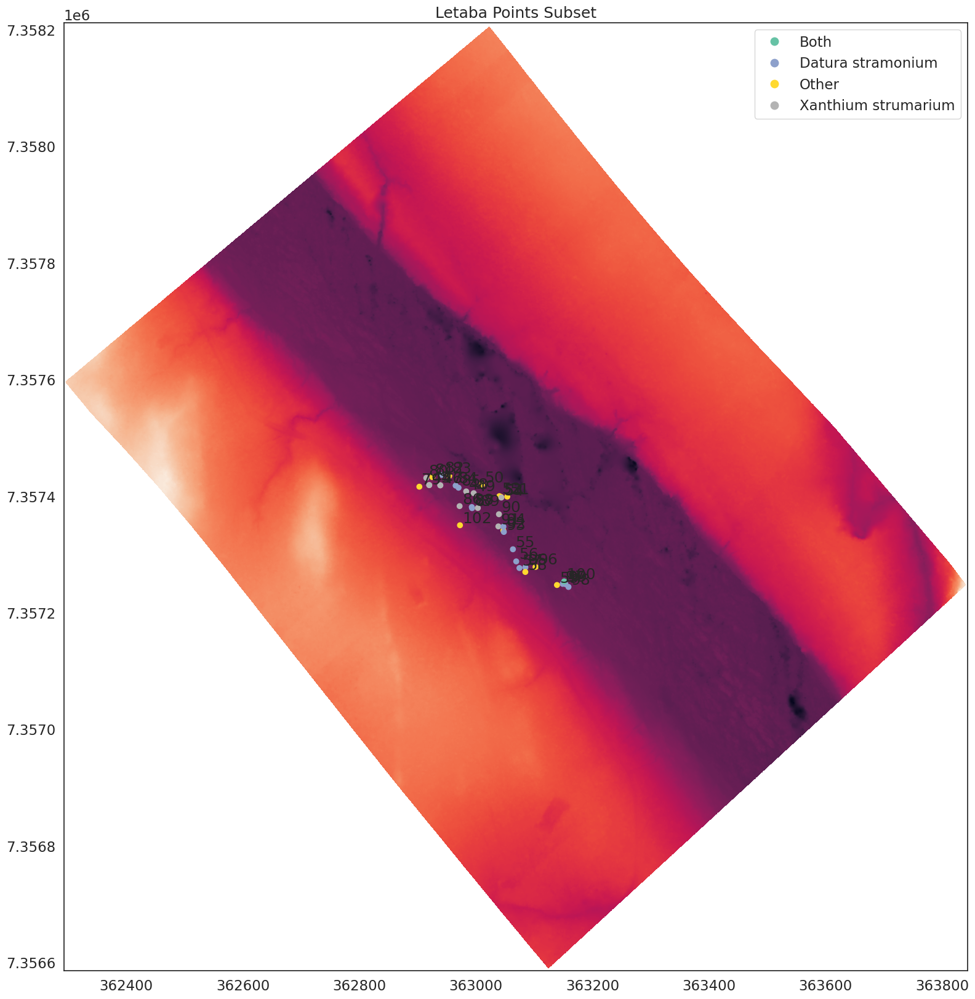

In [5]:
bucket_path = "gs://mlai-research/raw-data-dump/data_masked_letaba/"
shp_filename = "letaba_invasives_june21_utm.shp"
tif_filename = "dtm_28cm_mask.tif"
gdf, rasterimg = load_data(bucket_path, shp_filename, tif_filename)
gdf = sync_crs(gdf, rasterimg)
clipped_gdf = clip_gdf(gdf, rasterimg.bounds)
plot_raster(clipped_gdf, rasterimg)

In [2]:
band_filenames = ["band_01_405nm_mask.tif",
"band_02_430nm_mask.tif",
"band_03_450nm_mask.tif",
"band_04_550nm_mask.tif",
"band_05_560nm_mask.tif",
"band_06_570nm_mask.tif",
"band_07_650nm_mask.tif",
"band_08_685nm_mask.tif",
"band_09_710nm_mask.tif",
"band_10_850nm_mask.tif"]

In [3]:
def get_band_profiles(bucket, band_filenames):
    band_size_dct = {}
    for i, filename in enumerate(band_filenames):
        with rasterio.open(f"{bucket_path}{filename}") as src:
            raster_profile = src.profile
            band_size_dct[f'band_{i+1}'] = {"height": raster_profile['height'],
                                          "width": raster_profile['width'],
                                         "crs": raster_profile['crs'],
                                          "transform": raster_profile['transform']
                                        }
    return pd.DataFrame(band_size_dct)

In [8]:
band_size_dct = get_band_profiles(bucket_path, band_filenames)

In [9]:
band_size_dct

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10
height,10592,10592,10595,10595,10595,10595,10595,10595,10595,10595
width,10101,10101,10102,10102,10102,10102,10102,10102,10102,10102
crs,(init),(init),(init),(init),(init),(init),(init),(init),(init),(init)
transform,"(0.1535629991419733, 0.0, 362292.84996986337, ...","(0.1535629991419733, 0.0, 362292.84996986337, ...","(0.15356299914197094, 0.0, 362292.7379106992, ...","(0.15356299914197094, 0.0, 362292.7379106992, ...","(0.15356299914197094, 0.0, 362292.7379106992, ...","(0.15356299914197094, 0.0, 362292.7379106992, ...","(0.15356299914197094, 0.0, 362292.7379106992, ...","(0.15356299914197094, 0.0, 362292.7379106992, ...","(0.15356299914197094, 0.0, 362292.7379106992, ...","(0.15356299914197094, 0.0, 362292.7379106992, ..."


In [10]:
with rasterio.open(f"{bucket_path}band_02_430nm_mask.tif") as src:
    sml_raster_profile = src.profile

In [11]:
with rasterio.open(f"{bucket_path}band_03_450nm_mask.tif") as src:
    lrg_raster_profile = src.profile

In [12]:
sml_raster_profile

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 10101, 'height': 10592, 'count': 1, 'crs': CRS.from_epsg(32736), 'transform': Affine(0.1535629991419733, 0.0, 362292.84996986337,
       0.0, -0.15356300003906456, 7358212.504589749), 'blockysize': 1, 'tiled': False, 'interleave': 'band'}

In [13]:
lrg_raster_profile

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 10102, 'height': 10595, 'count': 1, 'crs': CRS.from_epsg(32736), 'transform': Affine(0.15356299914197094, 0.0, 362292.7379106992,
       0.0, -0.153563000039061, 7358212.701470669), 'blockysize': 1, 'tiled': False, 'interleave': 'band'}

In [14]:
raster_profile = sml_raster_profile

In [15]:
min_width = 10101
min_height = 10592

stack = np.zeros((len(band_filenames), min_height, min_width), dtype=raster_profile['dtype'])

for i, filename in enumerate(band_filenames):
    with rasterio.open(f"{bucket_path}{filename}") as src:
        # Crop the band to match the minimum dimensions
        window = rasterio.windows.Window(0, 0, min_width, min_height)
        data = src.read(window=window)
        
        # Calculate the shift in pixels
        dx = int((src.transform.c - raster_profile['transform'].c) / src.transform.a)
        dy = int((src.transform.f - raster_profile['transform'].f) / src.transform.e)
        
        # Shift the pixels to align the grid
        data = np.roll(data, dx, axis=-1)
        data = np.roll(data, dy, axis=-2)
        
        stack[i] = data[0]

In [16]:
bucket_path

'gs://mlai-research/raw-data-dump/data_masked_letaba/'

In [21]:
raster_profile['count'] = stack.shape[0]

In [22]:
with rasterio.open(f"../data/02_intermediate/all_bands.tif", 'w', **raster_profile) as dst:
    dst.write(stack)

In [24]:
# clipped_gdf

In [3]:
all_bnds_img = rasterio.open(f"../data/02_intermediate/all_bands.tif")
all_bnds_img2 = rxr.open_rasterio("../data/02_intermediate/all_bands.tif")

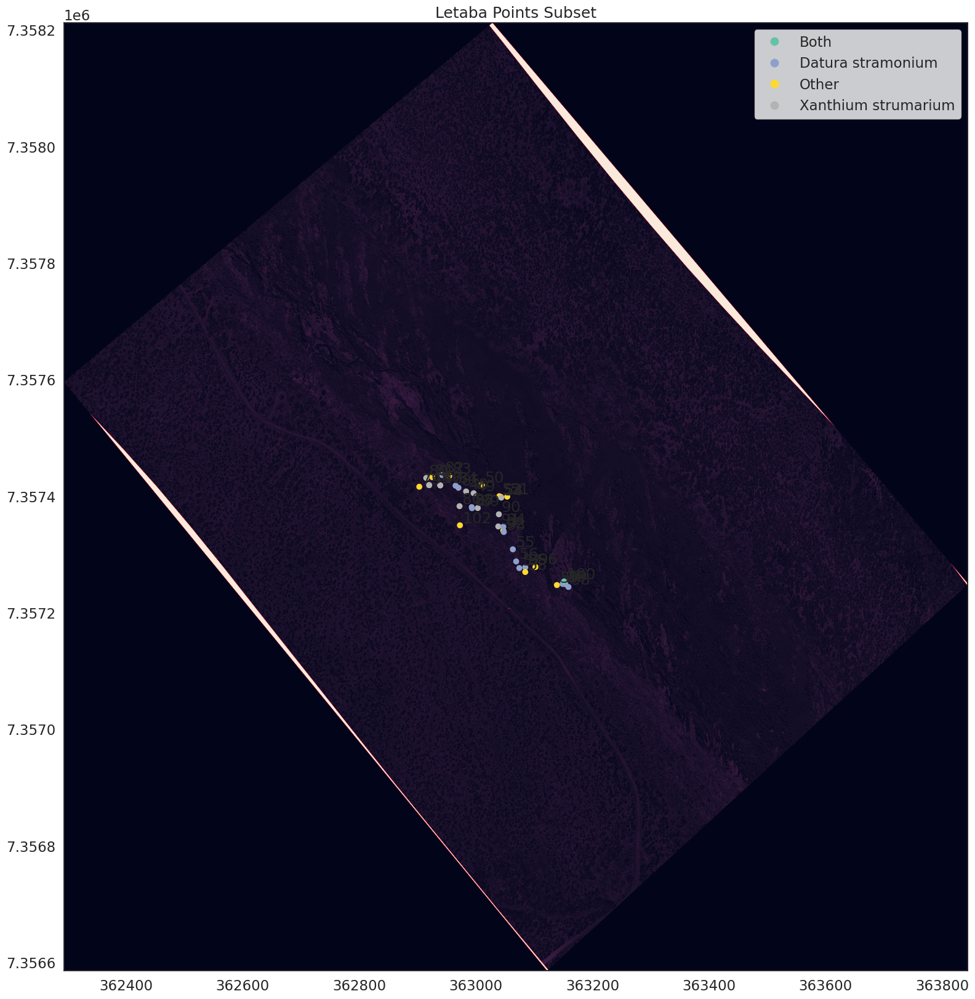

In [26]:
plot_raster(clipped_gdf, all_bnds_img)

In [6]:
def create_curr_dir_name(buffer_size):
    dt = datetime.now()
    currtime = int(time.time()) 
    directory = f"{dt.month}{dt.day}-{currtime}-{buffer_size}"
    return directory


def create_crop_dir(parent_dir, buffer_size):
    directory = create_curr_dir_name(buffer_size)
    path = os.path.join(parent_dir, directory)
    os.mkdir(path)
    return path


def save_label_buffered_tiffs(gdf, rasterimg2, path, buffer_size=1):
    gdf_copy = gdf.copy()
    gdf_copy['geometry'] = gdf_copy['geometry'].buffer(buffer_size, cap_style=3)
    # Clean up Photos column to be used to label crops later..
    gdf_copy["Photos"] = gdf.Photos.str.split(expand=True)[1]
    for row in gdf_copy.itertuples():
        clas = row.Species.split()[0].lower()
        owner = row.Photos
        ind = row.photoID
        clipped_raster = rasterimg2.rio.clip([row.geometry])
        clipped_raster.rio.to_raster(f'{path}/{clas}_{owner}_{ind}.tiff')
        
        
def get_files(path):
    return glob.glob(f'{path}/*.tiff')


def calc_rows_cols(files):
    ncols = 3 # set number of columns
    nrows = len(files) // ncols + (len(files) % ncols > 0) # calculate number of rows
    return ncols, nrows


def plot_cropped_imgs(files, ncols, nrows):
    plt.figure(figsize=(15, 20))
    plt.suptitle("Cropped images", fontsize=18, y=0.95)
    for n, file in enumerate(files):
        ax = plt.subplot(nrows, ncols, n + 1) # add a new subplot iteratively using nrows and cols
        saved_clipped_raster_io = rasterio.open(f"{file}") # Plot raster crop
        rasterio.plot.show(saved_clipped_raster_io, ax=ax)
        # chart formatting
        ax.set_title(os.path.basename(file), fontsize=8)
        ax.axis('off')
    plt.show()

In [ ]:
parent_dir = "../data/02_intermediate/"
buffer_size = 3

path = create_crop_dir(parent_dir, buffer_size)
save_label_buffered_tiffs(clipped_gdf, all_bnds_img2, path, buffer_size)
files = get_files(path)
ncols, nrows = calc_rows_cols(files)
plot_cropped_imgs(files, ncols, nrows)

In [25]:
with rasterio.open(f"{bucket_path}{band_filenames[0]}") as src:
    raster_profile = src.profile

In [26]:
raster_profile

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 10101, 'height': 10592, 'count': 1, 'crs': CRS.from_epsg(32736), 'transform': Affine(0.1535629991419733, 0.0, 362292.84996986337,
       0.0, -0.15356300003906456, 7358212.504589749), 'blockysize': 1, 'tiled': False, 'interleave': 'band'}

In [28]:
raster_profile.update(count=len(band_filenames), dtype="uint16")

In [29]:
stack = np.zeros((raster_profile['count'], 
                  raster_profile['height'],
                  raster_profile['width']),
                 dtype=raster_profile['dtype'])

In [30]:
with rasterio.open(f"{bucket_path}{band_filenames[0]}") as src:
    stack[0] = src.read(1)

In [31]:
for i, filename in enumerate(band_filenames[1:]):
    with rasterio.open(f"{bucket_path}{filename}") as src:
        stack[i+1] = src.read(1)

ValueError: could not broadcast input array from shape (10595,10102) into shape (10592,10101)

In [42]:
"""
#Use this code to read in a smaller window of the entire raster for faster processing?
with rasterio.open('tests/data/RGB.byte.tif') as src:
    w = src.read(1, window=Window(0, 0, 512, 256))
    
-> https://rasterio.readthedocs.io/en/latest/topics/windowed-rw.html#windowrw

"""

def load_data(bucket_path):
    gdf = gpd.read_file(f"{bucket_path}letaba_points_subset.shp") # import shapefile using geopandas
    rasterimg = rasterio.open(f"{bucket_path}clipped_ortho_aoi_1.tif") # import tif using rasterio
    rasterimg2 = rxr.open_rasterio("gs://mlai-research/raw-data-dump/subset-001/clipped_ortho_aoi_1.tif")
    return gdf, rasterimg, rasterimg2

In [43]:
def sync_crs(gdf, rasterimg):
    if not gdf.crs:
        gdf = gdf.set_crs(str(rasterimg.crs))
        

def check_crs(gdf, rasterimg) -> bool: 
    if gdf.crs == rasterimg.crs:
        pass
    else:
        sync_crs(gdf, rasterimg)

In [44]:
def plot_raster(gdf, rasterimg):
    fig, ax = plt.subplots(figsize = (20,20))
    rasterio.plot.show(rasterimg, ax=ax)
    gdf.plot(column='Species',
                   categorical=True,
                   legend=True,
                   # markersize=45,
                   cmap="Set2",
                   ax=ax,
            aspect=1)
    ax.set_title("Letaba Points Subset")
    for x, y, label in zip(gdf.geometry.x, gdf.geometry.y, gdf.photoID):
        ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")
    plt.show()

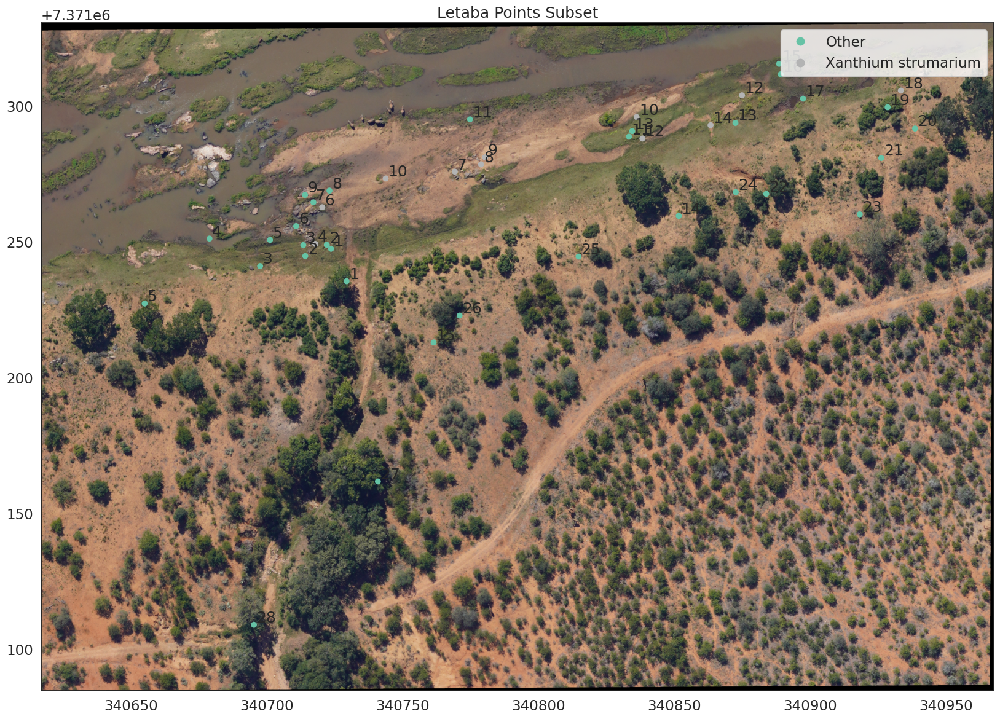

In [45]:
bucket_path = "gs://mlai-research/raw-data-dump/subset-001/"
gdf, rasterimg, rasterimg2 = load_data(bucket_path)
check_crs(gdf, rasterimg)
plot_raster(gdf, rasterimg)

In [50]:
gdf

,Collector,Date,Time,Latitude,Longitude,Altitude,Accuracy,Species,Descriptio,photoID,Photos,Original_n,tag,geometry
0,SMF,2022-06-01,07:59:46.000,-23.762108,31.437080,246.3,0.28,Other,Philenoptera violacea as tributary exits,1,See smfPics1,Trib in. Apple leaf,0,POINT Z (340729.445 7371235.519 246.300)
1,SMF,2022-06-01,08:00:40.000,-23.761987,31.437010,246.7,0.29,Other,Reeds,2,See smfPics1,Reeds,0,POINT Z (340722.163 7371248.913 246.700)
2,SMF,2022-06-01,08:01:39.000,-23.761987,31.436925,246.5,0.27,Other,Rock,3,See smfPics1,Different substrate rock,0,POINT Z (340713.499 7371248.818 246.500)
3,SMF,2022-06-01,08:02:30.000,-23.761983,31.436968,246.8,0.31,Xanthium strumarium,None,4,See smfPics1,Xan,0,POINT Z (340717.911 7371249.236 246.800)
4,SMF,2022-06-01,08:03:38.000,-23.761968,31.436805,246.8,0.33,Other,Eichhornia crassipes,5,See smfPics1,Hyca,0,POINT Z (340701.246 7371250.714 246.800)
5,SMF,2022-06-01,08:04:27.000,-23.761923,31.436900,247.1,0.28,Other,Dead Eichhornia crassipes,6,See smfPics1,Dead Hyac,0,POINT Z (340710.874 7371255.804 247.100)
6,SMF,2022-06-01,08:05:49.000,-23.761845,31.436963,247.1,0.33,Other,Eichhornia crassipes,7,See smfPics1,"Hyacinth, Reeds and rock",0,POINT Z (340717.233 7371264.549 247.100)
7,SMF,2022-06-01,08:06:33.000,-23.761807,31.437022,248.3,0.31,Other,Water,8,See smfPics1,Water,0,POINT Z (340723.133 7371268.859 248.300)
8,SMF,2022-06-01,08:07:35.000,-23.761820,31.436933,248.5,0.30,Other,Asclepias spp,9,See smfPics1,Milk weed,0,POINT Z (340714.145 7371267.284 248.500)
9,SMF,2022-06-01,08:09:19.000,-23.761768,31.437225,248.5,0.29,Xanthium strumarium,With other species,10,See smfPics1,Xan + other,0,POINT Z (340743.810 7371273.333 248.500)


Now, the next issue is that the GeoDF contains Geometry as Points (It's a data type). This will not allow us to select a portion of the raster. This must consequently be converted into a polygon. We have the ability to choose how much buffer around the point we should use. This must be sufficient so as to capture the plant, but not so much so as to add noise. TRICKY! 

In [47]:
def create_curr_dir_name(buffer_size):
    dt = datetime.now()
    currtime = int(time.time()) 
    directory = f"{dt.month}{dt.day}-{currtime}-{buffer_size}"
    return directory


def create_crop_dir(parent_dir, buffer_size):
    directory = create_curr_dir_name(buffer_size)
    path = os.path.join(parent_dir, directory)
    os.mkdir(path)
    return path


def save_label_buffered_tiffs(path, buffer_size=1):
    gdf_copy = gdf.copy()
    gdf_copy['geometry'] = gdf_copy['geometry'].buffer(buffer_size, cap_style=3)
    # Clean up Photos column to be used to label crops later..
    gdf_copy["Photos"] = gdf.Photos.str.split(expand=True)[1]
    for row in gdf_copy.itertuples():
        clas = row.Species.split()[0].lower()
        owner = row.Photos
        ind = row.photoID
        clipped_raster = rasterimg2.rio.clip([row.geometry])
        clipped_raster.rio.to_raster(f'{path}/{clas}_{owner}_{ind}.tiff')
        
        
def get_files(path):
    return glob.glob(f'{path}/*.tiff')


def calc_rows_cols(files):
    ncols = 3 # set number of columns
    nrows = len(files) // ncols + (len(files) % ncols > 0) # calculate number of rows
    return ncols, nrows


def plot_cropped_imgs(files, ncols, nrows):
    plt.figure(figsize=(15, 20))
    plt.suptitle("Cropped images", fontsize=18, y=0.95)
    for n, file in enumerate(files):
        ax = plt.subplot(nrows, ncols, n + 1) # add a new subplot iteratively using nrows and cols
        saved_clipped_raster_io = rasterio.open(f"{file}") # Plot raster crop
        rasterio.plot.show(saved_clipped_raster_io, ax=ax)
        # chart formatting
        ax.set_title(os.path.basename(file), fontsize=8)
        ax.axis('off')
    plt.show()

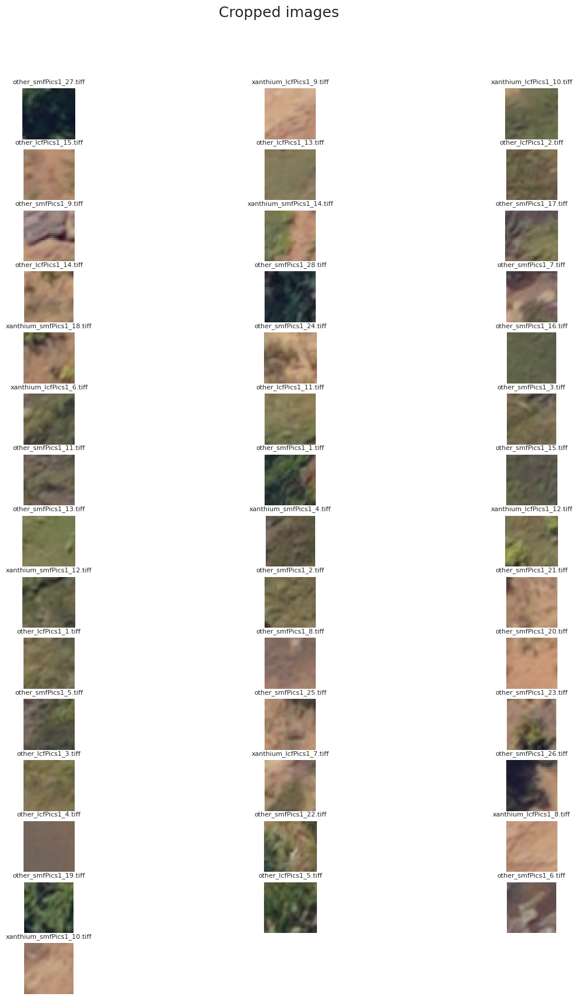

In [48]:
parent_dir = "../data/02_intermediate/"
buffer_size = 3

path = create_crop_dir(parent_dir, buffer_size)
save_label_buffered_tiffs(path, buffer_size)
files = get_files(path)
ncols, nrows = calc_rows_cols(files)
plot_cropped_imgs(files, ncols, nrows)

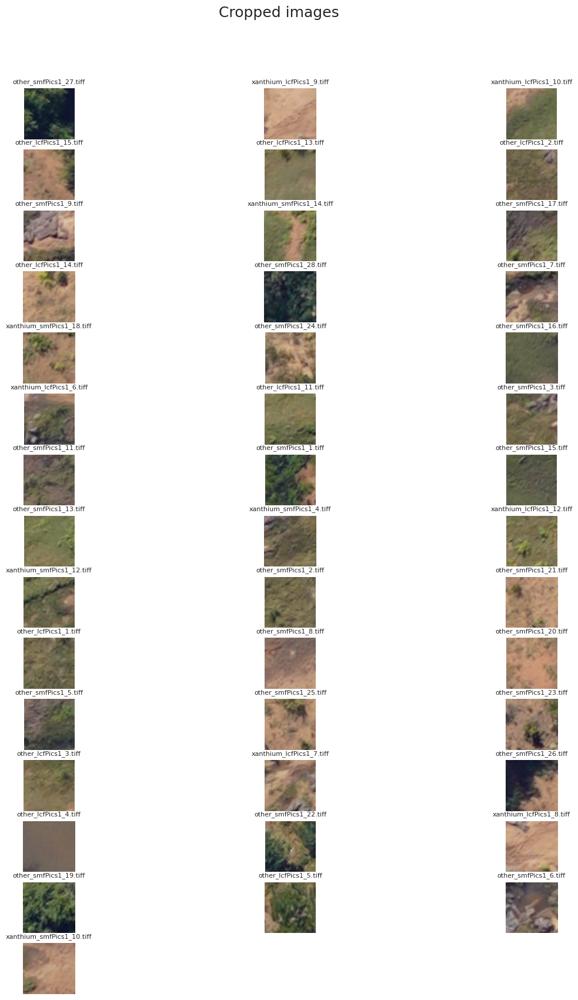

In [49]:
parent_dir = "../data/02_intermediate/"
path = create_crop_dir(parent_dir)
save_label_buffered_tiffs(path, buffer_size=2)
files = get_files(path)
ncols, nrows = calc_rows_cols(files)
plot_cropped_imgs(files, ncols, nrows)

In [6]:
rasterimg.shape

(3592, 5122)

In [10]:
rasterimg.read().shape # (bands, rows, columns)

(3, 3592, 5122)

In [11]:
arr_st = np.stack(rasterimg)

TypeError: dispatcher for __array_function__ did not return an iterable

In [13]:
rasterimg2.shape

(3, 3592, 5122)

In [14]:
rasterimg2

<xarray.DataArray (band: 3, y: 3592, x: 5122)>
[55194672 values with dtype=uint8]
Coordinates:
  * band         (band) int64 1 2 3
  * x            (x) float64 3.406e+05 3.406e+05 3.406e+05 ... 3.41e+05 3.41e+05
  * y            (y) float64 7.371e+06 7.371e+06 ... 7.371e+06 7.371e+06
    spatial_ref  int64 0
Attributes:
    _FillValue:    0.0
    scale_factor:  1.0
    add_offset:    0.0

In [17]:
vari = (rasterimg2[1] - rasterimg2[2])/ (rasterimg2[1] + rasterimg2[2] - rasterimg2[0]) # (G - R) / (G + R - B)

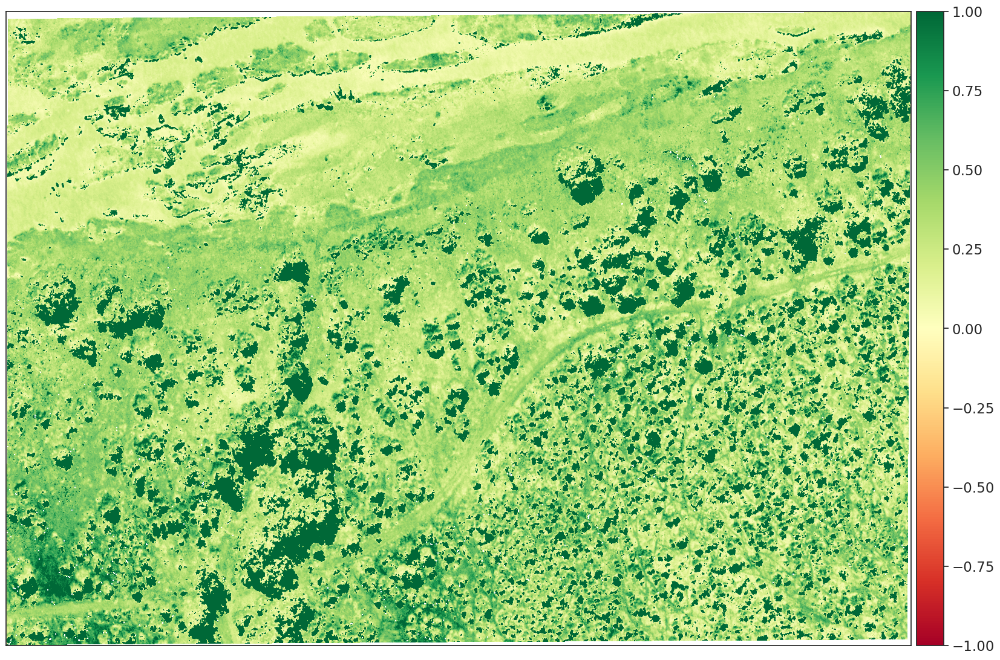

In [18]:
ep.plot_bands(vari, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(20, 20))
plt.show()

In [19]:
gcc = rasterimg2[1] / (rasterimg2[0] + rasterimg2[1] + rasterimg2[2]) # G / (R + G + B)

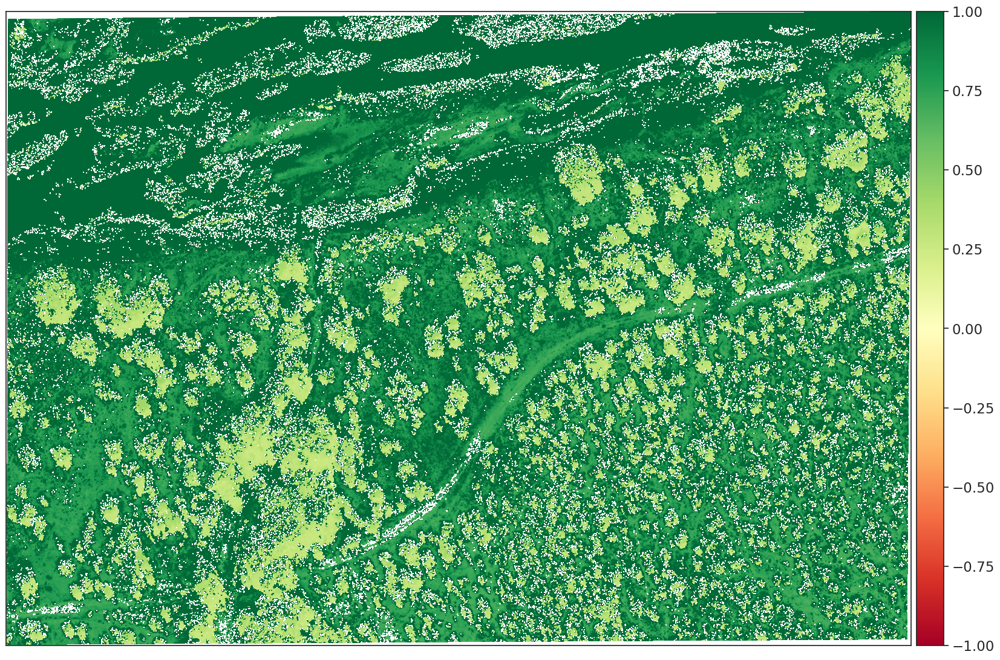

In [20]:
ep.plot_bands(gcc, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(20, 20))
plt.show()